# S2: Classical keypoint matching (ORB / AKAZE)

Detect keypoints + descriptors on the reference and the page, ratio-test
match, cluster matched keypoints by spatial proximity, localize the symbol.

This notebook confirms that **classical
keypoint detectors fail on engineering line-art** Showing the failure mode with numbers is more credible than
asserting it.

In [ ]:
import sys, os
from pathlib import Path
PKG_ROOT = Path.cwd().parents[0] if Path.cwd().name == 'notebooks' else Path.cwd()
sys.path.insert(0, str(PKG_ROOT / 'src'))
os.chdir(PKG_ROOT)

import warnings
warnings.filterwarnings('ignore')

import numpy as np, cv2, matplotlib.pyplot as plt
from IPython.display import display
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 80

In [2]:
from symbol_matching import benchmark, pdf_io, viz
from symbol_matching.strategies import s2_keypoint
from symbol_matching.eval import evaluate
ref = benchmark.load_reference_crop()
pages = [pdf_io.render_page(benchmark.CD_SET_PDF, i, dpi=benchmark.DPI) for i in range(3)]
gts = benchmark.ground_truth_per_page()

## Keypoints on the reference

AKAZE on reference: 1 keypoints, desc shape (1, 61)


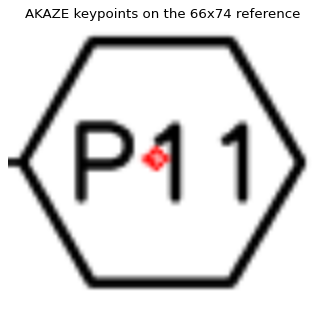

In [3]:
det = cv2.AKAZE_create()
kp, desc = det.detectAndCompute(ref, None)
print(f'AKAZE on reference: {len(kp)} keypoints, desc shape {None if desc is None else desc.shape}')
vis = cv2.drawKeypoints(ref, kp, None, color=(0, 0, 255), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(5, 5))
plt.imshow(cv2.cvtColor(cv2.resize(vis, (vis.shape[1]*4, vis.shape[0]*4)), cv2.COLOR_BGR2RGB))
plt.title('AKAZE keypoints on the 66x74 reference')
plt.axis('off'); plt.show()

## Run S2 on each page

In [4]:
import time
for detector in ['orb', 'akaze']:
    print(f'\n=== detector={detector} ===')
    for pi in range(3):
        t0 = time.time()
        m = s2_keypoint.find_matches_on_page(pages[pi], ref, detector=detector, page_idx=pi)
        dt = time.time() - t0
        e = evaluate(m, gts[pi])
        print(f'  p{pi}: {len(m):>3} matches / GT={len(gts[pi]):<3}  P={e.precision:.2f}  R={e.recall:.2f}  F1={e.f1:.2f}  {dt:.1f}s')


=== detector=orb ===
  p0:   0 matches / GT=157  P=0.00  R=0.00  F1=0.00  1.3s
  p1:   0 matches / GT=70   P=0.00  R=0.00  F1=0.00  0.8s
  p2:   0 matches / GT=4    P=0.00  R=0.00  F1=0.00  0.7s

=== detector=akaze ===
  p0:   0 matches / GT=157  P=0.00  R=0.00  F1=0.00  14.6s
  p1:   0 matches / GT=70   P=0.00  R=0.00  F1=0.00  13.7s
  p2:   0 matches / GT=4    P=0.00  R=0.00  F1=0.00  13.6s


## Annotated page 0 (AKAZE)

In [5]:
from IPython.display import Image, display
matches_p0 = s2_keypoint.find_matches_on_page(pages[0], ref, detector='akaze', page_idx=0)
annotated = viz.annotate_page(pages[0], matches_p0, thickness=4, font_scale=0.6)
print(f'S2 AKAZE on p0 — {len(matches_p0)} matches / {len(gts[0])} GT  '
      f'(image: {annotated.shape[1]}x{annotated.shape[0]})')
ok, png_bytes = cv2.imencode('.png', annotated)
display(Image(data=png_bytes.tobytes()))

S2 AKAZE on p0 — 0 matches / 157 GT  (image: 10800x7200)
